In [10]:
from torch_geometric.datasets import TUDataset
from torch_geometric.datasets import Planetoid
import networkx as nx
from torch_geometric.utils import to_networkx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np


def plot_graph(data):
    G = to_networkx(data, to_undirected=data.is_undirected())
    
    # Calculate unique degrees to color nodes based on degree
    degrees = dict(G.degree())
    unique_degrees = sorted(set(degrees.values()))
    cmap = plt.get_cmap('viridis', len(unique_degrees))
    degree_to_color = {degree: cmap(i) for i, degree in enumerate(unique_degrees)}
    node_colors = [degree_to_color[degrees[node]] for node in G.nodes()]

    # Use a spring layout to spread out nodes, with adjustments to scale
    pos = nx.spring_layout(G, seed=42, k=0.3)  # Adjust `k` for spacing

    nx.draw(G, pos, node_color=node_colors, node_size=20, edge_color="gray", with_labels=False)

    # Create legend for node degrees and place it outside the plot area
    legend_patches = [mpatches.Patch(color=cmap(i), label=f'Degree {degree}') for i, degree in enumerate(unique_degrees)]
    plt.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1.05, 1), title='Node Degree')

    # Adjust the plot layout to make room for the legend
    plt.subplots_adjust(right=0.8)
    plt.show()


def get_node_feature_count(data):
    # Check if node features exist
    if hasattr(data, 'x') and data.x is not None:
        num_features = data.x.shape[1]
        return num_features
    return None


def calculate_features(dataset):
    # For storing aggregate values
    tot_avg_deg = 0
    tot_network_diameter = 0
    tot_avg_path_len = 0
    tot_avg_clustering = 0
    num_graphs = len(dataset)
    num_connected_graphs = 0

    # Summing values
    for i, data in enumerate(dataset):
        G = to_networkx(data, to_undirected=data.is_undirected())

        degrees = dict(G.degree())
        avg_deg = sum(degrees.values()) / len(degrees)
        tot_avg_deg += avg_deg

        avg_clustering = nx.average_clustering(G)
        tot_avg_clustering += avg_clustering

        if nx.is_connected(G):
            network_diameter = nx.diameter(G)
            avg_path_len = nx.average_shortest_path_length(G)
            tot_network_diameter += network_diameter
            tot_avg_path_len += avg_path_len
            num_connected_graphs += 1

    # Taking the average
    average_degree = tot_avg_deg / num_graphs
    try:
        average_diameter = tot_network_diameter / num_connected_graphs
        average_path_length = tot_avg_path_len / num_connected_graphs
    except:
        average_diameter = None
        average_path_length = None
    average_clustering_coefficient = tot_avg_clustering / num_graphs

    # Print the results
    print(f'Total number of graphs: {num_graphs}')
    print(f'Total number of connected graphs: {num_connected_graphs}')
    print(f'Average degree: {average_degree}')
    print(f'Average network diameter: {average_diameter}')
    print(f'Average path length: {average_path_length}')
    print(f'Average clustering coefficient: {average_clustering_coefficient}')
    print(f'Feature in each node: {get_node_feature_count(dataset[0])}')

## Plotting IMDB-BINARY Dataset

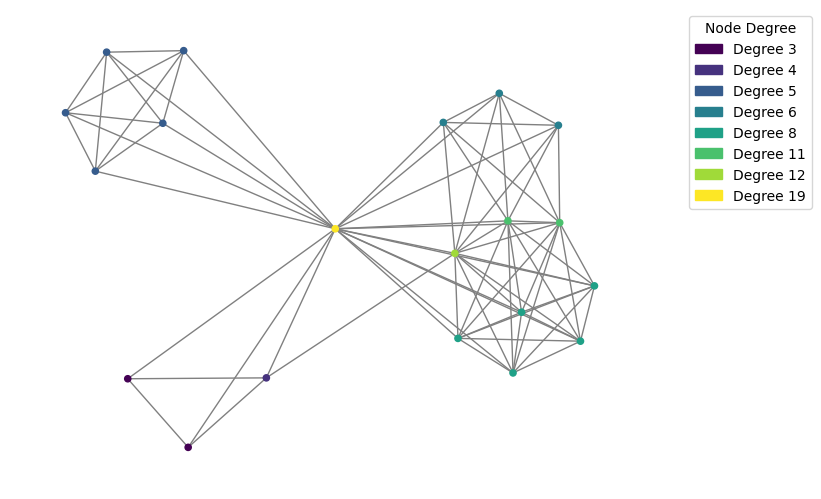

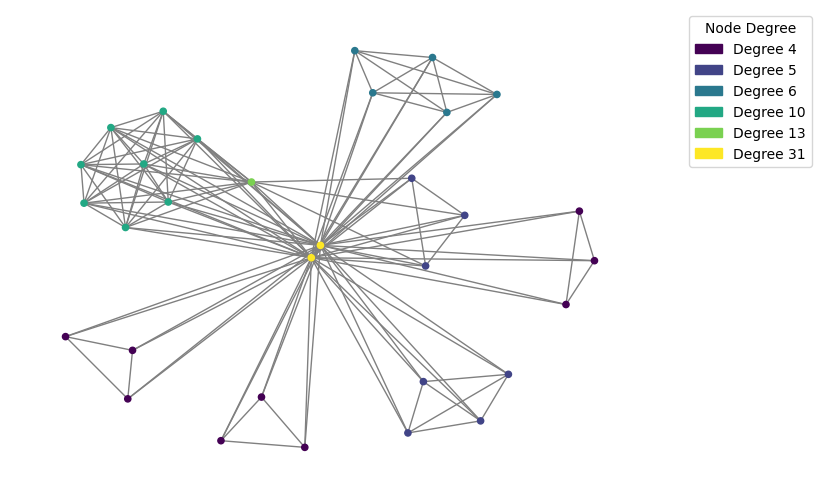

Total number of graphs: 1000
Total number of connected graphs: 1000
Average degree: 8.885904503361854
Average network diameter: 1.861
Average path length: 1.4793820761034784
Average clustering coefficient: 0.9470755285248149
Feature in each node: None


In [5]:
dataset1 = TUDataset(root='/tmp/IMDB-BINARY', name='IMDB-BINARY')
plot_graph(dataset1[0])
plot_graph(dataset1[1])
calculate_features(dataset1)

## Plotting ENZYMES Dataset

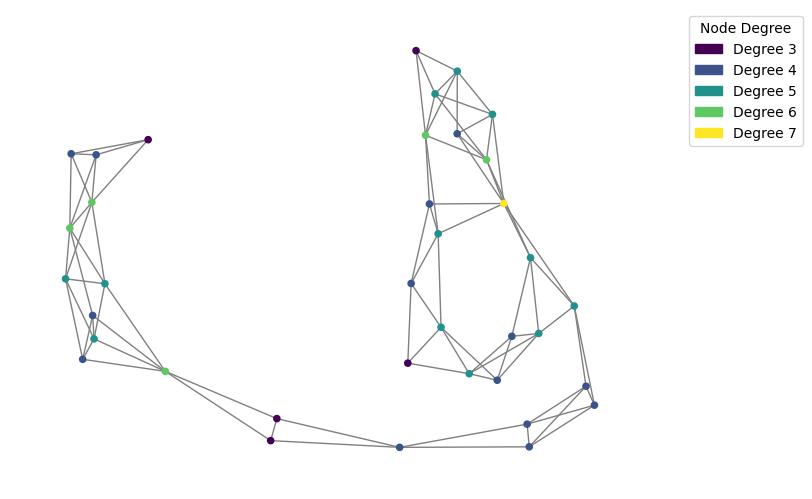

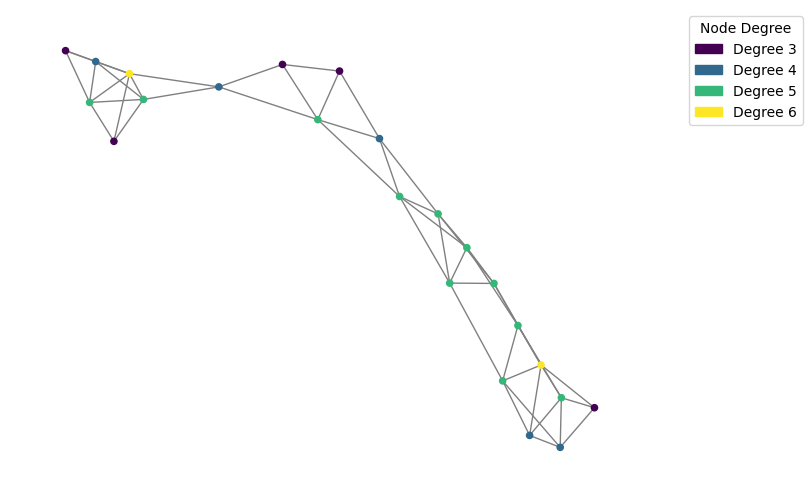

Total number of graphs: 600
Total number of connected graphs: 569
Average degree: 3.862625314410416
Average network diameter: 10.922671353251317
Average path length: 4.446107754162448
Average clustering coefficient: 0.4533912862690094
Feature in each node: 3


In [6]:
dataset2 = TUDataset(root='/tmp/ENZYMES', name='ENZYMES')
plot_graph(dataset2[0])
plot_graph(dataset2[1])
calculate_features(dataset2)

## Plotting Cora Dataset

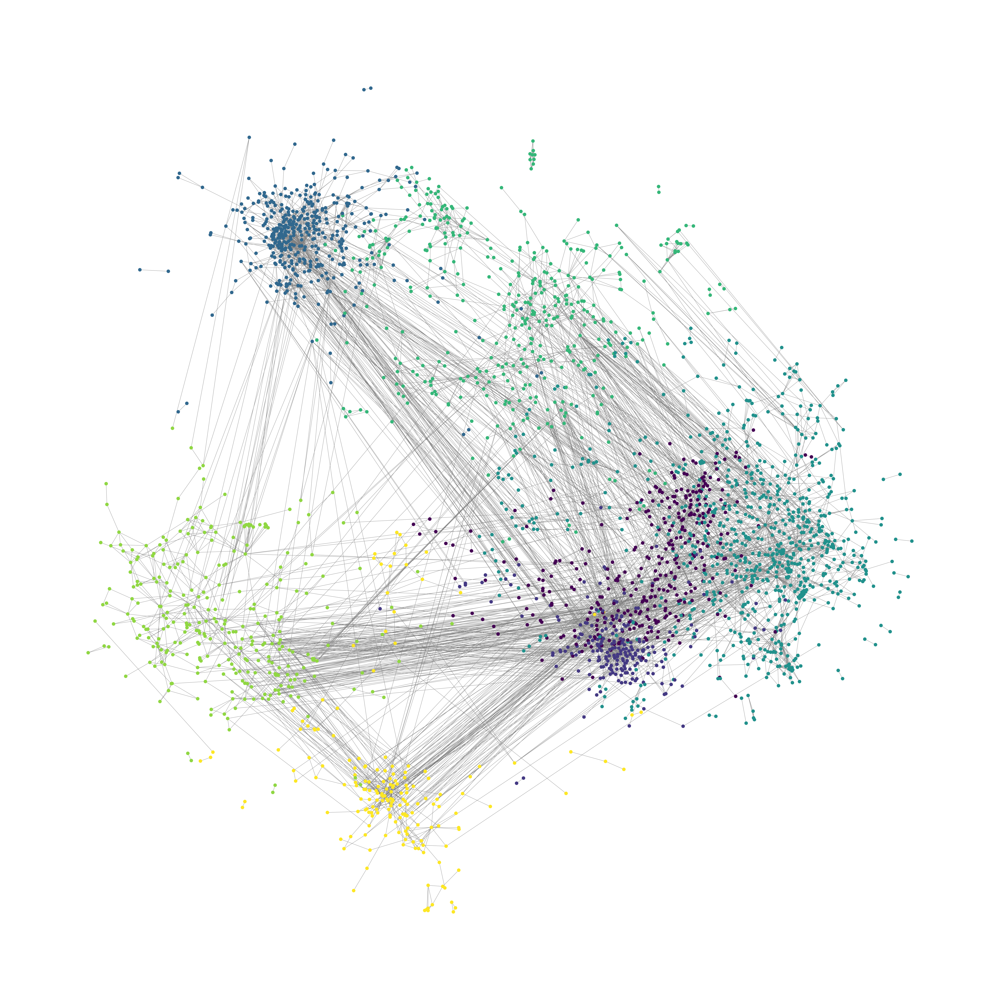

In [4]:
def community_layout(G, predicted_classes, k, iterations=100):
    pos = nx.spring_layout(G, k=k, iterations=iterations)

    # Define communities
    communities = {}
    for node, pclass in enumerate(predicted_classes.cpu().numpy()):
        if pclass not in communities:
            communities[pclass] = []
        communities[pclass].append(node)

    # Adjust positions within each community
    for community_nodes in communities.values():
        # Get the average x and y for each community
        avg_x = np.mean([pos[n][0] for n in community_nodes])
        avg_y = np.mean([pos[n][1] for n in community_nodes])

        # Adjust nodes in the community to be closer to their community's centroid
        for n in community_nodes:
            pos[n] = [avg_x + (pos[n][0] - avg_x) * 0.2, avg_y + (pos[n][1] - avg_y) * 0.2]

    return pos


def plot_graph(data):
    G = to_networkx(data, to_undirected=data.is_undirected())
    
    num_classes = len(set(data.y.cpu().numpy()))
    cmap = plt.get_cmap('viridis', num_classes)
    node_colors = [cmap(data.y[node].item()) for node in G.nodes()]

    # Generate layout where same-class nodes are grouped
    pos = community_layout(G, data.y, k=0.1)

    plt.figure(figsize=(60, 60))
    nx.draw(
        G,
        pos,
        node_color=node_colors,
        node_size=200,
        edge_color='gray'
    )

    plt.show()


dataset = Planetoid(root='/tmp/Cora', name='Cora')
plot_graph(data)